In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import seaborn as sns
import plotly.express as px

import warnings
from warnings import filterwarnings
filterwarnings('ignore')


from sklearn import metrics
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing  import StandardScaler

In [2]:
data = pd.read_csv("Car details v3.csv")

In [3]:
data.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   object 
 9   engine         7907 non-null   object 
 10  max_power      7913 non-null   object 
 11  torque         7906 non-null   object 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 825.6+ KB


In [5]:
data.describe()

,year,selling_price,km_driven,seats
count,8128.000000,8.128000e+03,8.128000e+03,7907.000000
mean,2013.804011,6.382718e+05,6.981951e+04,5.416719
std,4.044249,8.062534e+05,5.655055e+04,0.959588
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.800000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


(array([[8., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [7., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
        [7., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
        [8., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]),
 array([9.59587520e-01, 1.00000086e+06, 2.00000077e+06, 3.00000067e+06,
        4.00000058e+06, 5.00000048e+06, 6.00000038e+06, 7.00000029e+06,
        8.00000019e+06, 9.00000010e+06, 1.00000000e+07]),
 <a list of 4 BarContainer objects>)

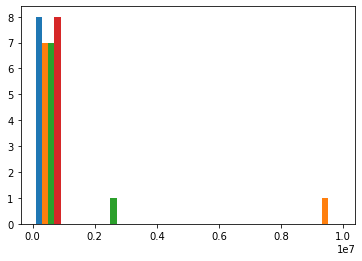

In [6]:
plt.hist(data.describe())

In [7]:
data.isna().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          221
engine           221
max_power        215
torque           222
seats            221
dtype: int64

In [8]:
data.shape

(8128, 13)

In [9]:
data['mileage']=data['mileage'].astype('string')

In [10]:
data['engine']=data['engine'].astype('string')
data['max_power']=data['max_power'].astype('string')
data['torque']=data['torque'].astype('string')

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   string 
 9   engine         7907 non-null   string 
 10  max_power      7913 non-null   string 
 11  torque         7906 non-null   string 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(5), string(4)
memory usage: 825.6+ KB


In [12]:
def split(x):
    return x.split(' ')[0]

In [13]:
data['mileage'].unique()

<StringArray>
[  '23.4 kmpl',  '21.14 kmpl',   '17.7 kmpl',   '23.0 kmpl',   '16.1 kmpl',
  '20.14 kmpl',  '17.3 km/kg',  '23.59 kmpl',   '20.0 kmpl',  '19.01 kmpl',
 ...
  '14.62 kmpl', '26.83 km/kg',  '11.45 kmpl',  '12.08 kmpl',  '15.74 kmpl',
   '11.3 kmpl',  '15.1 km/kg',  '14.21 kmpl',  '11.72 kmpl',  '16.51 kmpl']
Length: 394, dtype: string

In [14]:
data.dropna(inplace=True)

In [15]:
data.isna().sum()

name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
torque           0
seats            0
dtype: int64

In [16]:
data['mileage']=data['mileage'].apply(split)

In [17]:
data.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0


In [18]:
data['engine']=data['engine'].apply(split)
data['max_power']=data['max_power'].apply(split)

In [19]:
data.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4,1248,74,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7,1497,78,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0,1396,90,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1,1298,88.2,"11.5@ 4,500(kgm@ rpm)",5.0


In [20]:
data['engine']=data['engine'].astype('int64')

In [21]:
data['mileage']=data['mileage'].astype('float64')

In [22]:
data['max_power']=data['max_power'].astype('float64')

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7906 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           7906 non-null   object 
 1   year           7906 non-null   int64  
 2   selling_price  7906 non-null   int64  
 3   km_driven      7906 non-null   int64  
 4   fuel           7906 non-null   object 
 5   seller_type    7906 non-null   object 
 6   transmission   7906 non-null   object 
 7   owner          7906 non-null   object 
 8   mileage        7906 non-null   float64
 9   engine         7906 non-null   int64  
 10  max_power      7906 non-null   float64
 11  torque         7906 non-null   string 
 12  seats          7906 non-null   float64
dtypes: float64(3), int64(4), object(5), string(1)
memory usage: 864.7+ KB


In [24]:
def split_Nm(x):
    x.split( 'Nm@ ')[0]

In [25]:
data.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,"11.5@ 4,500(kgm@ rpm)",5.0


In [26]:
data.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque',
       'seats'],
      dtype='object')

In [27]:
data['Current_age']=2021-data['year']

In [28]:
data.head()    
data.drop('year',axis=1,inplace=True)

In [29]:
data.head()    

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Current_age
0,Maruti Swift Dzire VDI,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190Nm@ 2000rpm,5.0,7
1,Skoda Rapid 1.5 TDI Ambition,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,5.0,7
2,Honda City 2017-2020 EXi,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,"12.7@ 2,700(kgm@ rpm)",5.0,15
3,Hyundai i20 Sportz Diesel,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.4 kgm at 1750-2750rpm,5.0,11
4,Maruti Swift VXI BSIII,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,"11.5@ 4,500(kgm@ rpm)",5.0,14


In [30]:
import seaborn as sns

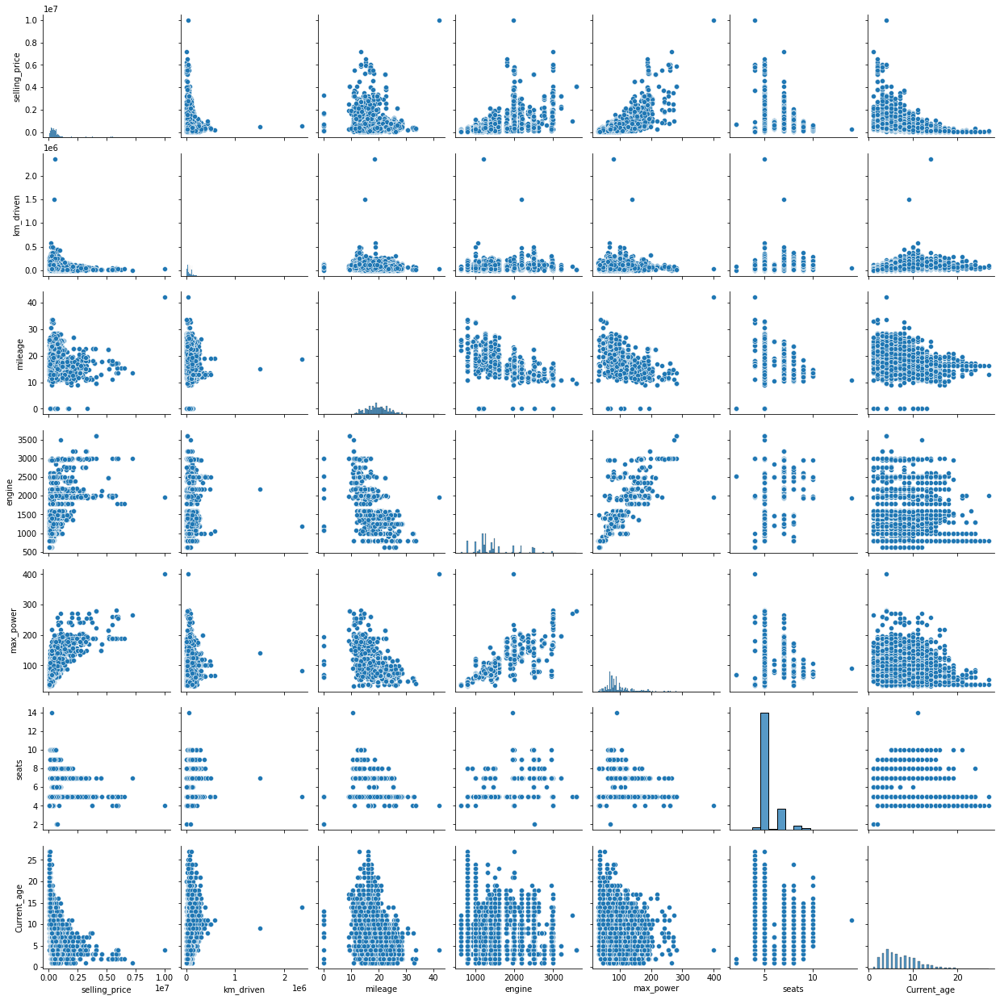

In [31]:
sns.pairplot(data)

<AxesSubplot:xlabel='mileage', ylabel='Density'>

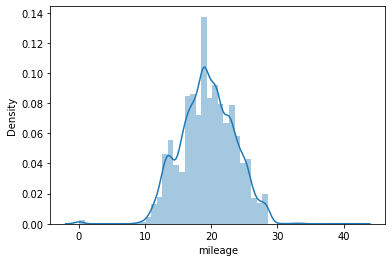

In [32]:
sns.distplot(data['mileage'])

<AxesSubplot:xlabel='engine', ylabel='Density'>

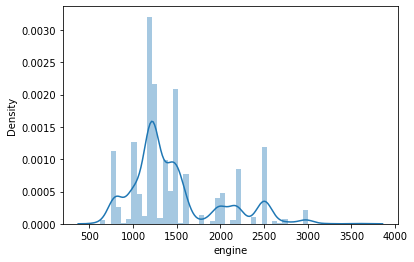

In [33]:
sns.distplot(data['engine'])

<AxesSubplot:xlabel='max_power', ylabel='Density'>

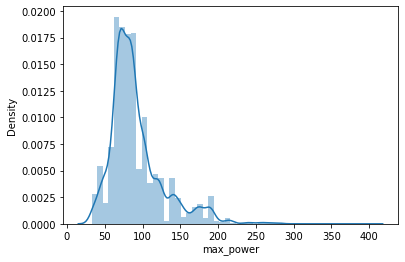

In [34]:
sns.distplot(data['max_power'])

<AxesSubplot:xlabel='selling_price', ylabel='Density'>

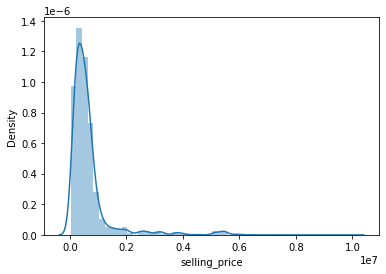

In [35]:
#target normalization check

sns.distplot(data['selling_price'])

<AxesSubplot:xlabel='km_driven', ylabel='Density'>

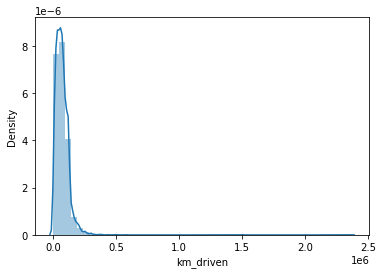

In [36]:
sns.distplot(data['km_driven'])

# Let's understand the relation between the dependent and independent variables

In [37]:
data.columns

Index(['name', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque',
       'seats', 'Current_age'],
      dtype='object')

In [38]:
px.bar(data,y='selling_price',x='Current_age',hover_name='name',title="Year vs Selling-Price")

Age = 2 and 4 has seen most of the car sales.

In [39]:
px.scatter(data,x='selling_price',y='fuel',hover_name='name',title=" Fuel vs Selling Price")

Petrol Variant has the highest selling price. Disel has been sold at 7.2M(BMW)

In [40]:
px.histogram(data,x='km_driven',y='selling_price')

Lesser driven car has the most highest selling_price. Correlation can be easily understood

Text(0.5, 1.0, 'Fuel Types and Selling Price')

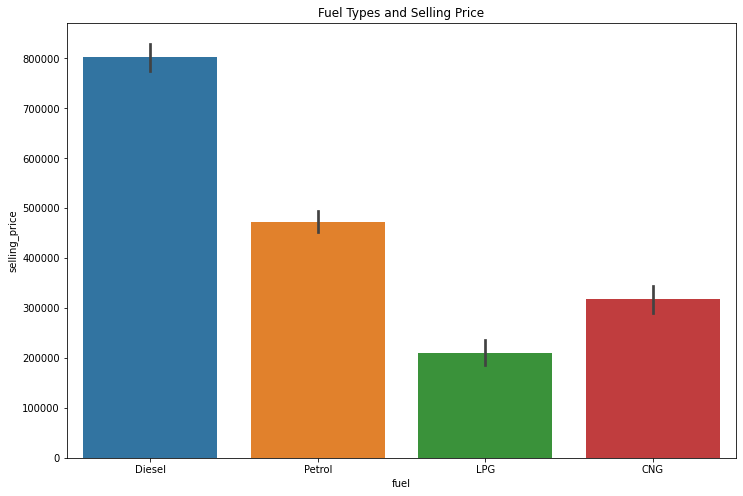

In [41]:
plt.figure(figsize=(12,8))
sns.barplot(data=data,x="fuel",y="selling_price")
plt.title("Fuel Types and Selling Price")

In [42]:
px.scatter(data,x='selling_price',y='name',size='Current_age',color='km_driven')

In [43]:
def seat_count(x):
    if x==4:
        return 'Sedan/Hatchback'
    elif x==5:
        return 'Compact SUV'
    else:
        return 'SUV'

In [44]:
data['Car_Type']=data['seats'].apply(seat_count)

In [45]:
data.head(25)

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Current_age,Car_Type
0,Maruti Swift Dzire VDI,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190Nm@ 2000rpm,5.0,7,Compact SUV
1,Skoda Rapid 1.5 TDI Ambition,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,5.0,7,Compact SUV
2,Honda City 2017-2020 EXi,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,"12.7@ 2,700(kgm@ rpm)",5.0,15,Compact SUV
3,Hyundai i20 Sportz Diesel,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.4 kgm at 1750-2750rpm,5.0,11,Compact SUV
4,Maruti Swift VXI BSIII,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,"11.5@ 4,500(kgm@ rpm)",5.0,14,Compact SUV
5,Hyundai Xcent 1.2 VTVT E Plus,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.75nm@ 4000rpm,5.0,4,Compact SUV
6,Maruti Wagon R LXI DUO BSIII,96000,175000,LPG,Individual,Manual,First Owner,17.30,1061,57.50,"7.8@ 4,500(kgm@ rpm)",5.0,14,Compact SUV
7,Maruti 800 DX BSII,45000,5000,Petrol,Individual,Manual,Second Owner,16.10,796,37.00,59Nm@ 2500rpm,4.0,20,Sedan/Hatchback
8,Toyota Etios VXD,350000,90000,Diesel,Individual,Manual,First Owner,23.59,1364,67.10,170Nm@ 1800-2400rpm,5.0,10,Compact SUV
9,Ford Figo Diesel Celebration Edition,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399,68.10,160Nm@ 2000rpm,5.0,8,Compact SUV


In [46]:
 px.scatter(data,x="Car_Type",y="selling_price",hover_name='Current_age',color='name',title=" Car Type vs Selling Price")

Text(0.5, 1.0, 'Various Car Type')

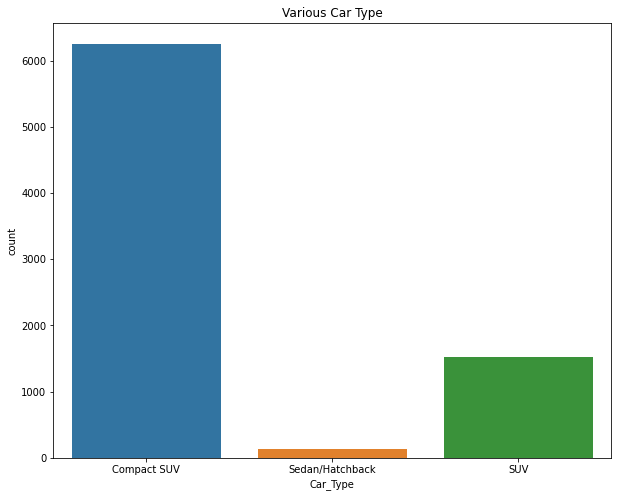

In [47]:
plt.figure(figsize=(10,8))
sns.countplot(data=data,x="Car_Type")
plt.title("Various Car Type")

In [48]:
names= data['Car_Type'].value_counts().index
values= data['Car_Type'].value_counts().values
px.pie(data['Car_Type'],names=names,values=values,title="Market Distribution for Different Car-Types")

Most of the cars sold belong to Compact-SUV. 

In [49]:
data.drop('seats',axis=1,inplace=True)

In [50]:
data_copy=data.copy()

Text(0.5, 1.0, 'Correlation')

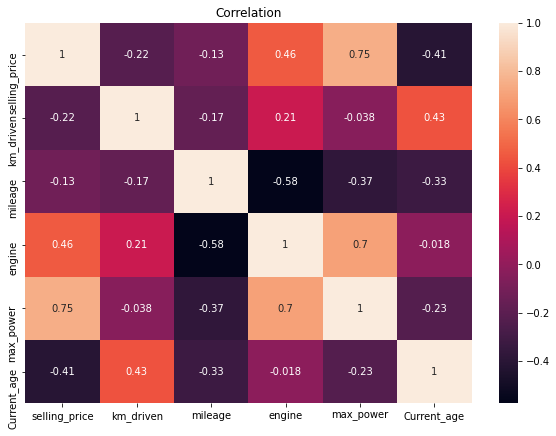

In [51]:
plt.figure(figsize=(10,7))
sns.heatmap(data.corr(),annot=True)
plt.title("Correlation")

In [52]:
data.head()

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,Current_age,Car_Type
0,Maruti Swift Dzire VDI,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190Nm@ 2000rpm,7,Compact SUV
1,Skoda Rapid 1.5 TDI Ambition,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,7,Compact SUV
2,Honda City 2017-2020 EXi,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,"12.7@ 2,700(kgm@ rpm)",15,Compact SUV
3,Hyundai i20 Sportz Diesel,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.4 kgm at 1750-2750rpm,11,Compact SUV
4,Maruti Swift VXI BSIII,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,"11.5@ 4,500(kgm@ rpm)",14,Compact SUV


# Encoding

In [53]:
data.head()

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,Current_age,Car_Type
0,Maruti Swift Dzire VDI,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190Nm@ 2000rpm,7,Compact SUV
1,Skoda Rapid 1.5 TDI Ambition,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,7,Compact SUV
2,Honda City 2017-2020 EXi,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,"12.7@ 2,700(kgm@ rpm)",15,Compact SUV
3,Hyundai i20 Sportz Diesel,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.4 kgm at 1750-2750rpm,11,Compact SUV
4,Maruti Swift VXI BSIII,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,"11.5@ 4,500(kgm@ rpm)",14,Compact SUV


In [54]:
fuel_type=pd.get_dummies(data['fuel'],drop_first=True)
fuel_type

,Diesel,LPG,Petrol
0,1,0,0
1,1,0,0
2,0,0,1
3,1,0,0
4,0,0,1
...,...,...,...
8123,0,0,1
8124,1,0,0
8125,1,0,0
8126,1,0,0


In [55]:
vehicle_type=pd.get_dummies(data['Car_Type'])
vehicle_type



,Compact SUV,SUV,Sedan/Hatchback
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0
...,...,...,...
8123,1,0,0
8124,1,0,0
8125,1,0,0
8126,1,0,0


In [56]:
owner_type=pd.get_dummies(data['owner'],drop_first=True)
owner_type

,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner
0,0,0,0,0
1,0,1,0,0
2,0,0,0,1
3,0,0,0,0
4,0,0,0,0
...,...,...,...,...
8123,0,0,0,0
8124,1,0,0,0
8125,0,0,0,0
8126,0,0,0,0


In [57]:
data.drop('name',axis=1,inplace=True)

In [58]:
data.drop('torque',axis=1,inplace=True)

In [59]:
seller=pd.get_dummies(data['seller_type'])
seller

,Dealer,Individual,Trustmark Dealer
0,0,1,0
1,0,1,0
2,0,1,0
3,0,1,0
4,0,1,0
...,...,...,...
8123,0,1,0
8124,0,1,0
8125,0,1,0
8126,0,1,0


In [60]:
gear_type=pd.get_dummies(data['transmission'])
gear_type

,Automatic,Manual
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
8123,0,1
8124,0,1
8125,0,1
8126,0,1


In [61]:
data.head()

,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,Current_age,Car_Type
0,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,7,Compact SUV
1,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,7,Compact SUV
2,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,15,Compact SUV
3,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,11,Compact SUV
4,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,14,Compact SUV


In [62]:
data=pd.concat([data,fuel_type,seller,owner_type,gear_type,vehicle_type],axis=1)

In [63]:
data.head(20)

,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,Current_age,...,Trustmark Dealer,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Automatic,Manual,Compact SUV,SUV,Sedan/Hatchback
0,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,7,...,0,0,0,0,0,0,1,1,0,0
1,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,7,...,0,0,1,0,0,0,1,1,0,0
2,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,15,...,0,0,0,0,1,0,1,1,0,0
3,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,11,...,0,0,0,0,0,0,1,1,0,0
4,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,14,...,0,0,0,0,0,0,1,1,0,0
5,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,4,...,0,0,0,0,0,0,1,1,0,0
6,96000,175000,LPG,Individual,Manual,First Owner,17.30,1061,57.50,14,...,0,0,0,0,0,0,1,1,0,0
7,45000,5000,Petrol,Individual,Manual,Second Owner,16.10,796,37.00,20,...,0,0,1,0,0,0,1,0,0,1
8,350000,90000,Diesel,Individual,Manual,First Owner,23.59,1364,67.10,10,...,0,0,0,0,0,0,1,1,0,0
9,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399,68.10,8,...,0,0,0,0,0,0,1,1,0,0


In [64]:
data.drop(['seller_type','transmission','fuel','owner','Car_Type'],axis=1,inplace=True)

In [65]:
data.head()

,selling_price,km_driven,mileage,engine,max_power,Current_age,Diesel,LPG,Petrol,Dealer,...,Trustmark Dealer,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Automatic,Manual,Compact SUV,SUV,Sedan/Hatchback
0,450000,145500,23.40,1248,74.00,7,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
1,370000,120000,21.14,1498,103.52,7,1,0,0,0,...,0,0,1,0,0,0,1,1,0,0
2,158000,140000,17.70,1497,78.00,15,0,0,1,0,...,0,0,0,0,1,0,1,1,0,0
3,225000,127000,23.00,1396,90.00,11,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,130000,120000,16.10,1298,88.20,14,0,0,1,0,...,0,0,0,0,0,0,1,1,0,0


In [66]:
linear_data=data.copy()

In [67]:
linear_data.head()

,selling_price,km_driven,mileage,engine,max_power,Current_age,Diesel,LPG,Petrol,Dealer,...,Trustmark Dealer,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Automatic,Manual,Compact SUV,SUV,Sedan/Hatchback
0,450000,145500,23.40,1248,74.00,7,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
1,370000,120000,21.14,1498,103.52,7,1,0,0,0,...,0,0,1,0,0,0,1,1,0,0
2,158000,140000,17.70,1497,78.00,15,0,0,1,0,...,0,0,0,0,1,0,1,1,0,0
3,225000,127000,23.00,1396,90.00,11,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,130000,120000,16.10,1298,88.20,14,0,0,1,0,...,0,0,0,0,0,0,1,1,0,0


# StandardScaling

In [68]:
num_vars=['selling_price','km_driven','mileage','engine','max_power','Current_age']

In [69]:

scaler=StandardScaler()

In [70]:
linear_data[num_vars]=scaler.fit_transform(linear_data[num_vars])

In [71]:
linear_data.head()

,selling_price,km_driven,mileage,engine,max_power,Current_age,Diesel,LPG,Petrol,Dealer,...,Trustmark Dealer,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Automatic,Manual,Compact SUV,SUV,Sedan/Hatchback
0,-0.245613,1.343777,0.986157,-0.418188,-0.492024,-0.004158,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
1,-0.343950,0.894744,0.426198,0.077980,0.333827,-0.004158,1,0,0,0,...,0,0,1,0,0,0,1,1,0,0
2,-0.604542,1.246926,-0.426129,0.075995,-0.380120,2.066530,0,0,1,0,...,0,0,0,0,1,0,1,1,0,0
3,-0.522185,1.018008,0.887050,-0.124457,-0.044408,1.031186,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,-0.638960,0.894744,-0.822561,-0.318955,-0.094765,1.807694,0,0,1,0,...,0,0,0,0,0,0,1,1,0,0


In [72]:
X=linear_data.drop('selling_price',axis=1)

In [73]:
y=linear_data['selling_price'].values

In [74]:
X

,km_driven,mileage,engine,max_power,Current_age,Diesel,LPG,Petrol,Dealer,Individual,Trustmark Dealer,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Automatic,Manual,Compact SUV,SUV,Sedan/Hatchback
0,1.343777,0.986157,-0.418188,-0.492024,-0.004158,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0
1,0.894744,0.426198,0.077980,0.333827,-0.004158,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0
2,1.246926,-0.426129,0.075995,-0.380120,2.066530,0,0,1,0,1,0,0,0,0,1,0,1,1,0,0
3,1.018008,0.887050,-0.124457,-0.044408,1.031186,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0
4,0.894744,-0.822561,-0.318955,-0.094765,1.807694,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,0.718652,-0.227914,-0.519407,-0.244437,0.254678,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0
8124,0.877135,-0.649122,0.068057,0.515111,1.807694,1,0,0,0,1,0,1,0,0,0,0,1,1,0,0
8125,0.894744,-0.029698,-0.418188,-0.494822,1.290022,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0
8126,-0.778124,1.028278,-0.124457,-0.603928,0.254678,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0


In [75]:
y

array([-0.24561283, -0.34394955, -0.60454186, ..., -0.32919904,
       -0.44228627, -0.44228627])

In [76]:
X.shape

(7906, 20)

In [77]:
y.shape

(7906,)

In [78]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=102)

In [79]:
from sklearn import linear_model

regr = linear_model.LinearRegression()

In [80]:
regr.fit(X_train,y_train)

LinearRegression()

In [81]:
predictions=regr.predict(X_test)

In [82]:
print("Intercept :",regr.intercept_)

Intercept : 0.4801402724470453


In [83]:
print("Co-efficinets :", regr.coef_)

Co-efficinets : [-0.05186875  0.06582291  0.08155527  0.5530345  -0.19405868  0.00700257
  0.34064474 -0.03674414  0.22164745 -0.04811945 -0.173528    0.01172258
 -0.05202873  1.3372135  -0.00880388  0.25939789 -0.25939789 -0.25131341
 -0.37134991  0.62266332]


In [84]:
#Test Evaluation 
from sklearn.metrics import mean_squared_error, r2_score
print(r2_score(y_test, predictions)) #Coefficient of Determination
print(mean_squared_error(predictions, y_test)) #MSE (yA-yp)2/n

0.6950129028315972
0.3504284138111802


In [85]:
pd.DataFrame(regr.coef_,X.columns,columns=['Coefficient'])

,Coefficient
km_driven,-0.051869
mileage,0.065823
engine,0.081555
max_power,0.553035
Current_age,-0.194059
Diesel,0.007003
LPG,0.340645
Petrol,-0.036744
Dealer,0.221647
Individual,-0.048119


Text(0, 0.5, 'y_pred')

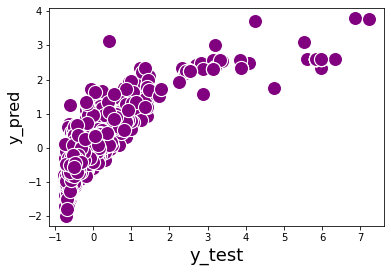

In [86]:
fig = plt.figure()
plt.scatter(y_test,predictions)
sns.scatterplot(x=y_test,y=predictions,color='purple' ,s=200)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          
plt.ylabel('y_pred', fontsize=16) 

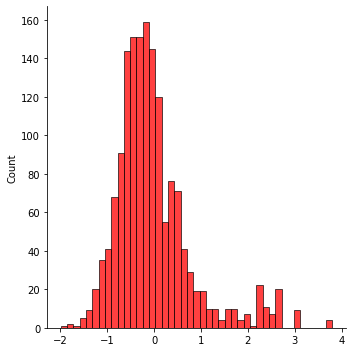

In [87]:
sns.displot(predictions,color='red')

The prediction is pretty normal

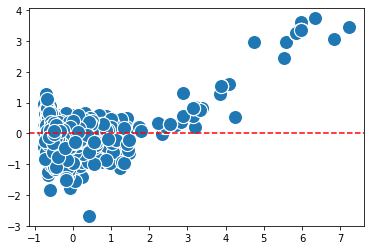

In [88]:
test_residual=y_test-predictions
sns.scatterplot(x=y_test,y=test_residual,s=200)
plt.axhline(y=0,color='red',ls='--')

In [89]:
pd.DataFrame({'Y_test':y_test,'Predicted':predictions})[20:]

,Y_test,Predicted
20,0.117004,0.026554
21,-0.405410,-0.547703
22,-0.479163,-0.661269
23,-0.368534,-0.261817
24,-0.030501,-0.130705
...,...,...
1577,-0.214883,0.273594
1578,0.553373,0.840315
1579,0.049397,0.344076
1580,-0.480392,-0.440850


The model needs to be closely monitored. 

# Feature Selection

In [90]:
X=np.array(X)

In [91]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()

vif=[variance_inflation_factor(X,i) for i in range(X.shape[1])]
print(vif)

[1.449240899480036, 2.8481102919390957, 5.270677895951699, 3.154263821836568, 2.177604732865873, 38.89945141099578, 1.6947602404137208, 39.1839442904747, inf, inf, inf, 1.1002208693814135, 1.277649702001364, 1.0066132382259285, 1.2017885106672532, inf, inf, inf, inf, inf]


In [92]:
X=pd.DataFrame(X)

In [93]:
X

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,1.343777,0.986157,-0.418188,-0.492024,-0.004158,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,0.894744,0.426198,0.077980,0.333827,-0.004158,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,1.246926,-0.426129,0.075995,-0.380120,2.066530,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0
3,1.018008,0.887050,-0.124457,-0.044408,1.031186,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,0.894744,-0.822561,-0.318955,-0.094765,1.807694,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,0.718652,-0.227914,-0.519407,-0.244437,0.254678,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
7902,0.877135,-0.649122,0.068057,0.515111,1.807694,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
7903,0.894744,-0.029698,-0.418188,-0.494822,1.290022,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
7904,-0.778124,1.028278,-0.124457,-0.603928,0.254678,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0


In [94]:
from sklearn.feature_selection import RFE
rfe=RFE(regr,10)

In [95]:
rfe.fit(X_train,y_train)

list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('km_driven', False, 6),
 ('mileage', False, 4),
 ('engine', False, 3),
 ('max_power', True, 1),
 ('Current_age', True, 1),
 ('Diesel', False, 11),
 ('LPG', True, 1),
 ('Petrol', False, 8),
 ('Dealer', True, 1),
 ('Individual', False, 7),
 ('Trustmark Dealer', False, 2),
 ('Fourth & Above Owner', False, 9),
 ('Second Owner', False, 5),
 ('Test Drive Car', True, 1),
 ('Third Owner', False, 10),
 ('Automatic', True, 1),
 ('Manual', True, 1),
 ('Compact SUV', True, 1),
 ('SUV', True, 1),
 ('Sedan/Hatchback', True, 1)]

In [96]:
col=X_train.columns[rfe.support_]
col

Index(['max_power', 'Current_age', 'LPG', 'Dealer', 'Test Drive Car',
       'Automatic', 'Manual', 'Compact SUV', 'SUV', 'Sedan/Hatchback'],
      dtype='object')

In [97]:
X_train_rfe=X_train[col]

In [98]:
import statsmodels.api as sm

In [99]:
X_train_rfe=sm.add_constant(X_train_rfe)
model=sm.OLS(y_train,X_train_rfe).fit()

In [100]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.686
Model:                            OLS   Adj. R-squared:                  0.685
Method:                 Least Squares   F-statistic:                     1721.
Date:                Sun, 26 Dec 2021   Prob (F-statistic):               0.00
Time:                        07:49:11   Log-Likelihood:                -5195.0
No. Observations:                6324   AIC:                         1.041e+04
Df Residuals:                    6315   BIC:                         1.047e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            1.351e+10   1.51e+12      0.009      0.993   -2.95e+12    2.98e+12
max_power           0.5868      0.009     66.538      0.000       0.570       0.604
Current_age        -0.2397      0.007    -32.039      0.000      -0.254      -0.225
LPG                 0.3304      0.111      2.983      0.003       0.113       0.547
Dealer              0.3016      0.022     13.917      0.000       0.259       0.344
Test Drive Car      1.2959      0.319      4.068      0.000       0.671       1.920
Automatic        -1.46e+10   1.64e+12     -0.009      0.993   -3.22e+12    3.19e+12
Manual           -1.46e+10   1.64e+12     -0.009      0.993   -3.22e+12    3.19e+12
Compact SUV      1.097e+09   1.23e+11      0.009      0.993    -2.4e+11    2.42e+11
SUV              1.097e+09   1.23e+11      0.009      0.993    -2.4e+11    2.42e+11
Sedan/Hatchback  1.097e+09   1.23e+11      0.009      0.993    -2.4e+11    2.42e+11
==============================================================================
Omnibus:                     3294.572   Durbin-Watson:                   1.992
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            53508.360
Skew:                           2.113   Prob(JB):                         0.00
Kurtosis:                      16.609   Cond. No.                     2.98e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.79e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [101]:
regr.fit(X_train_rfe,y_train)

LinearRegression()

In [102]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_rfe
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Automatic,inf
7,Manual,inf
9,SUV,1.483739e+10
10,Sedan/Hatchback,1.212492e+09
8,Compact SUV,2.669110e+03
1,max_power,1.620000e+00
4,Dealer,1.180000e+00
2,Current_age,1.170000e+00
3,LPG,1.010000e+00
5,Test Drive Car,1.000000e+00


We can see some great multicollinearity amongst the dependent features

The new column for Car_Type and Transmission is showing high multicollinearity.

In [103]:
#Lets try other regression algorithms

In [104]:
data.head()

,selling_price,km_driven,mileage,engine,max_power,Current_age,Diesel,LPG,Petrol,Dealer,...,Trustmark Dealer,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Automatic,Manual,Compact SUV,SUV,Sedan/Hatchback
0,450000,145500,23.40,1248,74.00,7,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
1,370000,120000,21.14,1498,103.52,7,1,0,0,0,...,0,0,1,0,0,0,1,1,0,0
2,158000,140000,17.70,1497,78.00,15,0,0,1,0,...,0,0,0,0,1,0,1,1,0,0
3,225000,127000,23.00,1396,90.00,11,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,130000,120000,16.10,1298,88.20,14,0,0,1,0,...,0,0,0,0,0,0,1,1,0,0


# RandomForestRegressor

In [105]:
X=data.drop('selling_price',axis=1)

In [106]:
X.shape

(7906, 20)

In [107]:
y=data['selling_price'].values

In [108]:
y.shape

(7906,)

In [109]:
from sklearn.ensemble import RandomForestRegressor
model=RandomForestRegressor()

In [110]:
model.fit(X,y)

RandomForestRegressor()

In [111]:
model.feature_importances_

array([1.85752488e-02, 1.94447695e-02, 1.65576891e-02, 7.34875057e-01,
       1.93882443e-01, 1.62718426e-03, 6.14220660e-06, 1.63388181e-03,
       2.81962284e-03, 3.74907843e-03, 1.00458449e-04, 1.19068135e-04,
       9.90787623e-04, 1.60294876e-04, 2.18426945e-04, 6.29030165e-04,
       9.59071595e-04, 9.53518716e-04, 9.46472067e-04, 1.75175478e-03])

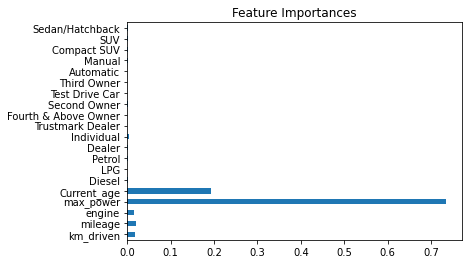

km_driven               0.018575
mileage                 0.019445
engine                  0.016558
max_power               0.734875
Current_age             0.193882
Diesel                  0.001627
LPG                     0.000006
Petrol                  0.001634
Dealer                  0.002820
Individual              0.003749
Trustmark Dealer        0.000100
Fourth & Above Owner    0.000119
Second Owner            0.000991
Test Drive Car          0.000160
Third Owner             0.000218
Automatic               0.000629
Manual                  0.000959
Compact SUV             0.000954
SUV                     0.000946
Sedan/Hatchback         0.001752
dtype: float64


In [112]:
feat_importance = pd.Series(model.feature_importances_, index=X.columns)
feat_importance.plot(kind='barh')
plt.title('Feature Importances')
plt.show()
print(feat_importance)

In [113]:
from sklearn.feature_selection import SelectFromModel

embed = SelectFromModel(model,threshold = 0.01, prefit=True)
print(embed.get_support())
X_new = embed.transform(X)

print('Before Embed', X.shape)
print('After Embed', X_new.shape)

[ True  True  True  True  True False False False False False False False
 False False False False False False False False]
Before Embed (7906, 20)
After Embed (7906, 5)


In [114]:
print("The selected features are \n",X.columns[embed.get_support()]) 

The selected features are 
 Index(['km_driven', 'mileage', 'engine', 'max_power', 'Current_age'], dtype='object')


In [115]:
features=['km_driven', 'mileage', 'engine', 'max_power', 'Current_age']

In [116]:
X_new=X.copy()

In [117]:
X_new.head()

,km_driven,mileage,engine,max_power,Current_age,Diesel,LPG,Petrol,Dealer,Individual,Trustmark Dealer,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Automatic,Manual,Compact SUV,SUV,Sedan/Hatchback
0,145500,23.40,1248,74.00,7,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0
1,120000,21.14,1498,103.52,7,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0
2,140000,17.70,1497,78.00,15,0,0,1,0,1,0,0,0,0,1,0,1,1,0,0
3,127000,23.00,1396,90.00,11,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0
4,120000,16.10,1298,88.20,14,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0


In [118]:
X_new=X_new[features]

In [119]:
X_new.head()

,km_driven,mileage,engine,max_power,Current_age
0,145500,23.40,1248,74.00,7
1,120000,21.14,1498,103.52,7
2,140000,17.70,1497,78.00,15
3,127000,23.00,1396,90.00,11
4,120000,16.10,1298,88.20,14


In [120]:
X_new.shape

(7906, 5)

In [121]:
y.shape

(7906,)

In [122]:
X_train,X_test,y_train,y_test=train_test_split(X_new,y,test_size=0.2,random_state=1001)

In [123]:
X_train.shape

(6324, 5)

In [124]:
y_train.shape

(6324,)

In [125]:
X_test.shape

(1582, 5)

In [126]:
y_test.shape

(1582,)

In [127]:
model=RandomForestRegressor()

In [128]:
model.fit(X_train,y_train)

RandomForestRegressor()

In [129]:
predict_rfr=model.predict(X_test)

In [130]:
pd.DataFrame({'Y_Test': y_test,'Y_Pred':predict_rfr})[:5]

,Y_Test,Y_Pred
0,475000,512249.680000
1,65000,89680.000000
2,631000,583360.000000
3,170000,162353.323333
4,45000,56699.780000


In [131]:

MAE_Elastic= metrics.mean_absolute_error(y_test, predict_rfr)
MSE_Elastic= metrics.mean_squared_error(y_test, predict_rfr)
RMSE_Elastic= np.sqrt(MSE_Elastic)

In [132]:
pd.DataFrame([MAE_Elastic, MSE_Elastic, RMSE_Elastic], index=['MAE_RFR', 'MSE_RFR', 'RMSE_RFR'], columns=['RandomForestRegressor Metrics'])

,RandomForestRegressor Metrics
MAE_RFR,7.552334e+04
MSE_RFR,3.821433e+10
RMSE_RFR,1.954849e+05


Text(0.5, 1.0, 'bias of y')

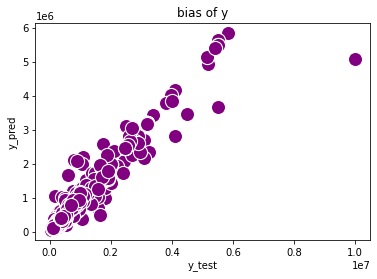

In [133]:
sns.scatterplot(x=y_test,y=predict_rfr,color='purple' ,s=200)
plt.ylabel('y_pred')
plt.xlabel('y_test')
plt.title('bias of y')

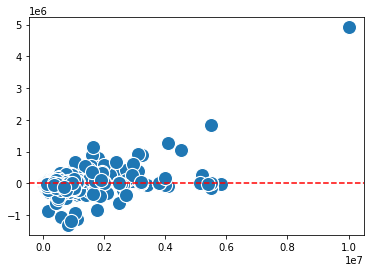

In [134]:
test_residual_xg=y_test-predict_rfr
sns.scatterplot(x=y_test,y=test_residual_xg,s=200)
plt.axhline(y=0,color='red',ls='--')

Clearly we can see the model is underperforming. We can hypertune the parameters or change the features and check again.

# Hypertuning The Model 

In [135]:
from sklearn.model_selection import cross_val_score

random_forest = RandomForestRegressor(max_depth=5)
random_forest.fit(X_train, y_train)
random_pred = random_forest.predict(X_test)
random_mean_absol_score = metrics.mean_absolute_error(y_test, random_pred)
random_mean_squared_error=metrics.mean_squared_error(y_test,random_pred)
random_rmse_error=np.sqrt(random_mean_squared_error)
acc_random = cross_val_score(random_forest, X_train, y_train, cv=5)

In [136]:
print("Average Mean Absolute Error is :", random_mean_absol_score)
print("Average Mean Squared Error is :", random_mean_squared_error)
print("Average RMSE is : ",random_rmse_error)

Average Mean Absolute Error is : 134696.65487802908
Average Mean Squared Error is : 67025444914.3768
Average RMSE is :  258892.7285853676


Clearly the model was underfitted. 

In [137]:
from sklearn.model_selection import RandomizedSearchCV# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 100, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 2)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [138]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 110, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100]},
                   random_state=42, verbose=2)

In [139]:
rf_random.best_estimator_

RandomForestRegressor(bootstrap=False, max_depth=110, max_features='sqrt')

In [140]:
rf_random.best_params_

{'n_estimators': 100,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 110,
 'bootstrap': False}

In [141]:
random_forest = RandomForestRegressor(n_estimators= 100, min_samples_split= 2, min_samples_leaf= 1, bootstrap=False,max_features='sqrt',max_depth=10)
random_forest.fit(X_train, y_train)
random_pred = random_forest.predict(X_test)


In [142]:
random_mean_absol_score = metrics.mean_absolute_error(y_test, random_pred)
random_mean_squared_error=metrics.mean_squared_error(y_test,random_pred)
random_rmse_error=np.sqrt(random_mean_squared_error)
acc_random = cross_val_score(random_forest, X_train, y_train, cv=5)

In [143]:
print("Average Mean Absolute Error is :", random_mean_absol_score)
print("Average Mean Squared Error is :", random_mean_squared_error)
print("Average RMSE is : ",random_rmse_error)

Average Mean Absolute Error is : 80618.36482449668
Average Mean Squared Error is : 46727407293.99954
Average RMSE is :  216165.23146426564


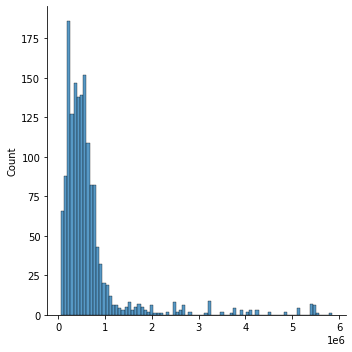

In [144]:
sns.displot(random_pred)

In [145]:
pd.DataFrame({'Actual Price': y_test,'Predicted Price':random_pred})

,Actual Price,Predicted Price
0,475000,440886.242597
1,65000,138317.961744
2,631000,569504.315247
3,170000,166748.274189
4,45000,60303.325397
...,...,...
1577,750000,827378.740826
1578,850000,764393.413779
1579,946000,830764.556560
1580,370000,482008.044745


In [146]:
data.head()

,selling_price,km_driven,mileage,engine,max_power,Current_age,Diesel,LPG,Petrol,Dealer,...,Trustmark Dealer,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Automatic,Manual,Compact SUV,SUV,Sedan/Hatchback
0,450000,145500,23.40,1248,74.00,7,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
1,370000,120000,21.14,1498,103.52,7,1,0,0,0,...,0,0,1,0,0,0,1,1,0,0
2,158000,140000,17.70,1497,78.00,15,0,0,1,0,...,0,0,0,0,1,0,1,1,0,0
3,225000,127000,23.00,1396,90.00,11,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,130000,120000,16.10,1298,88.20,14,0,0,1,0,...,0,0,0,0,0,0,1,1,0,0


In [175]:
car=pd.read_csv('Car details v3.csv')

In [176]:
car.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0


# Data Engineering

In [177]:
car.dropna(inplace=True)

In [178]:
car['mileage']=car['mileage'].astype('string')
car['engine']=car['engine'].astype('string')
car['max_power']=car['max_power'].astype('string')
car['torque']=car['torque'].astype('string')


In [179]:
car.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0


In [180]:
car['mileage']=car['mileage'].apply(split)
car['engine']=car['engine'].apply(split)
car['max_power']=car['max_power'].apply(split)

In [181]:
car['engine']=car['engine'].astype('int64')
car['mileage']=car['mileage'].astype('float64')
car['max_power']=car['max_power'].astype('float64')

In [182]:
car.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,"11.5@ 4,500(kgm@ rpm)",5.0


In [183]:
car.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7906 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           7906 non-null   object 
 1   year           7906 non-null   int64  
 2   selling_price  7906 non-null   int64  
 3   km_driven      7906 non-null   int64  
 4   fuel           7906 non-null   object 
 5   seller_type    7906 non-null   object 
 6   transmission   7906 non-null   object 
 7   owner          7906 non-null   object 
 8   mileage        7906 non-null   float64
 9   engine         7906 non-null   int64  
 10  max_power      7906 non-null   float64
 11  torque         7906 non-null   string 
 12  seats          7906 non-null   float64
dtypes: float64(3), int64(4), object(5), string(1)
memory usage: 864.7+ KB


In [184]:
car.drop('name',axis=1,inplace=True)

In [185]:
car.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190Nm@ 2000rpm,5.0
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,5.0
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,"12.7@ 2,700(kgm@ rpm)",5.0
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.4 kgm at 1750-2750rpm,5.0
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,"11.5@ 4,500(kgm@ rpm)",5.0


Text(0.5, 1.0, 'Correlation HeatMap')

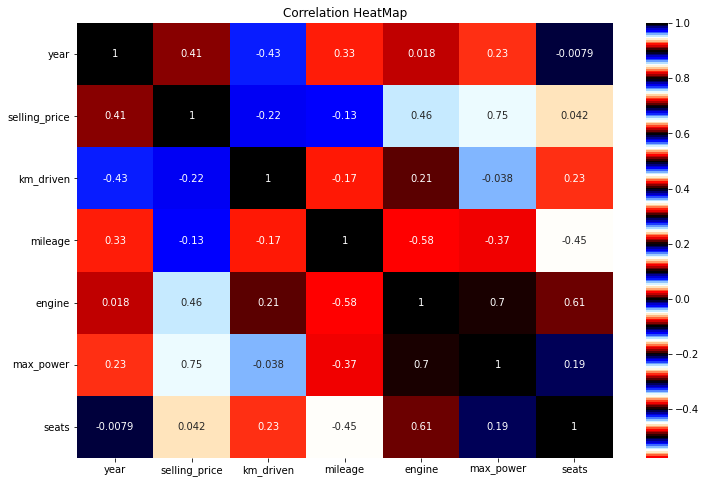

In [186]:
plt.figure(figsize=(12,8))
sns.heatmap(car.corr(), annot=True,cmap='flag')
plt.title("Correlation HeatMap")

In [187]:
car['Current_age']=2021-car['year']

# Encoding 

In [188]:
car.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Current_age
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190Nm@ 2000rpm,5.0,7
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,5.0,7
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,"12.7@ 2,700(kgm@ rpm)",5.0,15
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.4 kgm at 1750-2750rpm,5.0,11
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,"11.5@ 4,500(kgm@ rpm)",5.0,14


In [189]:
car.drop('torque',axis=1,inplace=True)

In [190]:
car.drop('year',axis=1,inplace=True)

In [191]:
car_copy=car.copy()

In [192]:
car_copy.head()

,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,Current_age
0,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5.0,7
1,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5.0,7
2,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,5.0,15
3,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5.0,11
4,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5.0,14


In [193]:
car['owner'].unique()

array(['First Owner', 'Second Owner', 'Third Owner',
       'Fourth & Above Owner', 'Test Drive Car'], dtype=object)

In [194]:
owner_Type= pd.get_dummies(car['owner'],drop_first=True)

In [195]:
transmission_type=pd.get_dummies(car['transmission'],drop_first=True)

In [196]:
car['seller_type'].unique()

array(['Individual', 'Dealer', 'Trustmark Dealer'], dtype=object)

In [197]:
seller = pd.get_dummies(car['seller_type'],drop_first=True)

In [198]:
fuel_type=pd.get_dummies(car['fuel'],drop_first=True)

In [199]:
car=pd.concat([car,owner_Type,transmission_type,seller,fuel_type],axis=1)

In [200]:
car.head()

,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,...,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Manual,Individual,Trustmark Dealer,Diesel,LPG,Petrol
0,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5.0,...,0,0,0,0,1,1,0,1,0,0
1,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5.0,...,0,1,0,0,1,1,0,1,0,0
2,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497,78.00,5.0,...,0,0,0,1,1,1,0,0,0,1
3,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5.0,...,0,0,0,0,1,1,0,1,0,0
4,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5.0,...,0,0,0,0,1,1,0,0,0,1


In [201]:
car.drop(['fuel','seller_type','owner','transmission'],axis=1,inplace=True)

In [202]:
car.head()

,selling_price,km_driven,mileage,engine,max_power,seats,Current_age,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Manual,Individual,Trustmark Dealer,Diesel,LPG,Petrol
0,450000,145500,23.40,1248,74.00,5.0,7,0,0,0,0,1,1,0,1,0,0
1,370000,120000,21.14,1498,103.52,5.0,7,0,1,0,0,1,1,0,1,0,0
2,158000,140000,17.70,1497,78.00,5.0,15,0,0,0,1,1,1,0,0,0,1
3,225000,127000,23.00,1396,90.00,5.0,11,0,0,0,0,1,1,0,1,0,0
4,130000,120000,16.10,1298,88.20,5.0,14,0,0,0,0,1,1,0,0,0,1


In [203]:
num_vars=['selling_price','km_driven','engine','max_power','seats','Current_age']

In [205]:
car_scaled = car.copy()

In [206]:
car_scaled[num_vars]=scaler.fit_transform(car_scaled[num_vars])

In [207]:
car_scaled.corr()

,selling_price,km_driven,mileage,engine,max_power,seats,Current_age,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Manual,Individual,Trustmark Dealer,Diesel,LPG,Petrol
selling_price,1.000000,-0.222158,-0.126280,0.455682,0.749674,0.041617,-0.412302,-0.073601,-0.178786,0.116081,-0.115113,-0.590269,-0.386151,0.032779,0.204831,-0.035978,-0.195074
km_driven,-0.222158,1.000000,-0.172980,0.206031,-0.038159,0.227259,0.428548,0.089244,0.209913,-0.024168,0.148795,0.201186,0.202851,-0.083181,0.271662,0.023095,-0.274460
mileage,-0.126280,-0.172980,1.000000,-0.576408,-0.374621,-0.451700,-0.328544,-0.072118,-0.101811,-0.015644,-0.097455,0.178986,0.011862,-0.036248,0.060256,-0.013924,-0.074927
engine,0.455682,0.206031,-0.576408,1.000000,0.703975,0.611103,-0.018263,-0.006433,0.020809,0.013954,-0.004743,-0.283206,-0.132215,0.038690,0.507383,-0.056681,-0.491189
max_power,0.749674,-0.038159,-0.374621,0.703975,1.000000,0.191999,-0.226598,-0.037283,-0.085206,0.049734,-0.054249,-0.541870,-0.286493,0.026493,0.304787,-0.060175,-0.286090
seats,0.041617,0.227259,-0.451700,0.611103,0.191999,1.000000,0.007923,0.007845,0.033751,-0.010921,0.005175,0.072722,0.081197,-0.028106,0.354764,-0.028949,-0.345399
Current_age,-0.412302,0.428548,-0.328544,-0.018263,-0.226598,0.007923,1.000000,0.205631,0.317328,-0.032661,0.271317,0.249002,0.243729,-0.100385,-0.037536,0.059887,0.034351
Fourth & Above Owner,-0.073601,0.089244,-0.072118,-0.006433,-0.037283,0.007845,0.205631,1.000000,-0.084083,-0.003615,-0.037741,0.040027,0.065014,-0.025210,-0.009021,0.003946,0.008609
Second Owner,-0.178786,0.209913,-0.101811,0.020809,-0.085206,0.033751,0.317328,-0.084083,1.000000,-0.014717,-0.153629,0.122257,0.168052,-0.046348,0.051721,0.013442,-0.055230
Test Drive Car,0.116081,-0.024168,-0.015644,0.013954,0.049734,-0.010921,-0.032661,-0.003615,-0.014717,1.000000,-0.006606,-0.049722,-0.055611,-0.004413,-0.017362,-0.001678,0.017957


<AxesSubplot:>

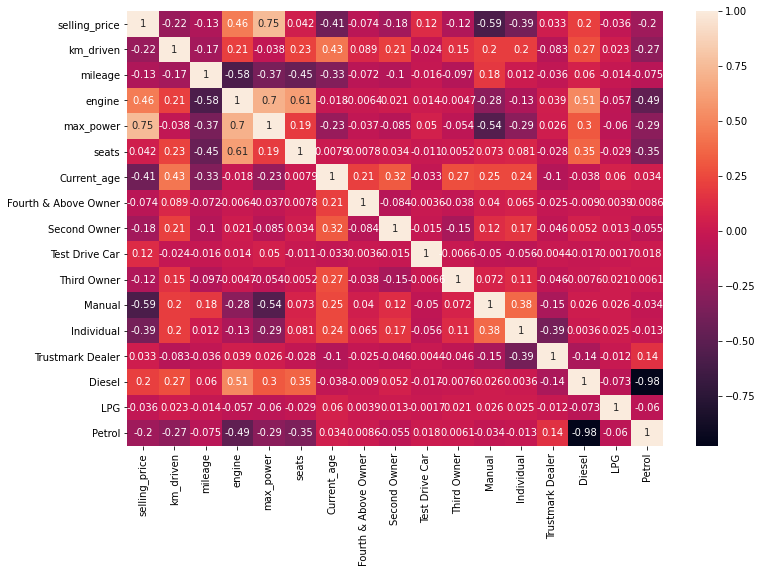

In [208]:
plt.figure(figsize=(12,8))
sns.heatmap(car_scaled.corr(),annot=True)

In [210]:
import shap

In [211]:
model1=RandomForestRegressor()

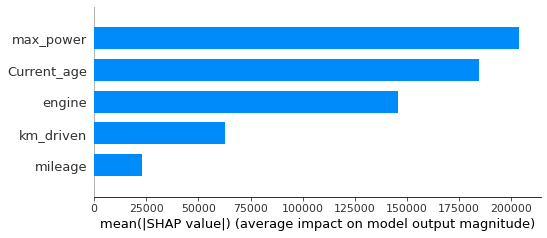

In [212]:
shap_values = shap.TreeExplainer(random_forest).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")


In [270]:
X= car_scaled.drop('selling_price',axis=1)

In [271]:
y=car_scaled['selling_price'].values

In [272]:
X.shape

(7906, 16)

In [273]:
y.shape

(7906,)

In [274]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=10)

In [275]:
from sklearn.ensemble import RandomForestRegressor

model=RandomForestRegressor()

In [276]:
model.fit(X_train,y_train)

RandomForestRegressor()

In [277]:
X_train.shape

(5929, 16)

In [278]:
y_train.shape

(5929,)

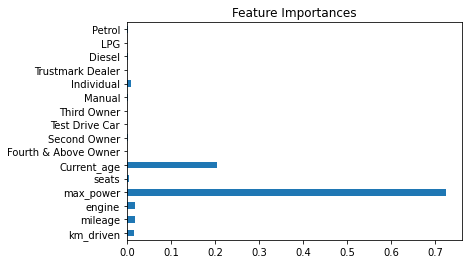

km_driven               0.016025
mileage                 0.016842
engine                  0.017236
max_power               0.725403
seats                   0.003648
Current_age             0.204846
Fourth & Above Owner    0.000117
Second Owner            0.001103
Test Drive Car          0.000358
Third Owner             0.000226
Manual                  0.002470
Individual              0.008604
Trustmark Dealer        0.000039
Diesel                  0.001681
LPG                     0.000007
Petrol                  0.001394
dtype: float64


In [279]:
feat_importance = pd.Series(model.feature_importances_, index=X.columns)
feat_importance.plot(kind='barh')
plt.title('Feature Importances')
plt.show()
print(feat_importance)

In [280]:
embed = SelectFromModel(model,threshold = 0.01, prefit=True)
print(embed.get_support())
X_new = embed.transform(X)

print('Before Embed', X.shape)
print('After Embed', X_new.shape)
print("The selected features are \n",X.columns[embed.get_support()]) 

[ True  True  True  True False  True False False False False False False
 False False False False]
Before Embed (7906, 16)
After Embed (7906, 5)
The selected features are 
 Index(['km_driven', 'mileage', 'engine', 'max_power', 'Current_age'], dtype='object')


In [281]:
features = ['km_driven', 'mileage', 'engine', 'max_power', 'Current_age', 'Individual']

In [282]:
X_feat=X.copy()

In [283]:
X_feat=X_feat[features]

In [284]:
X_feat.head()

,km_driven,mileage,engine,max_power,Current_age,Individual
0,1.343777,23.40,-0.418188,-0.492024,-0.004158,1
1,0.894744,21.14,0.077980,0.333827,-0.004158,1
2,1.246926,17.70,0.075995,-0.380120,2.066530,1
3,1.018008,23.00,-0.124457,-0.044408,1.031186,1
4,0.894744,16.10,-0.318955,-0.094765,1.807694,1


In [285]:
X_train,X_test,y_train,y_test=train_test_split(X_feat,y,test_size=0.2,random_state=101)

In [286]:
X_train.shape

(6324, 6)

In [287]:
y_train.shape

(6324,)

In [288]:
X_test.shape

(1582, 6)

In [289]:
X_train.shape

(6324, 6)

In [290]:
from sklearn.model_selection import RandomizedSearchCV# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 100, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 2)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)


{'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [291]:
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 110, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100]},
                   random_state=42, verbose=2)

In [292]:
rf_random.best_params_

{'n_estimators': 100,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 110,
 'bootstrap': True}

In [293]:
random_forest = RandomForestRegressor(n_estimators= 60, min_samples_split= 2, min_samples_leaf= 1, bootstrap=True)
random_forest.fit(X_train, y_train)
random_pred = random_forest.predict(X_test)


In [294]:
random_mean_absol_score = metrics.mean_absolute_error(y_test, random_pred)
random_mean_squared_error=metrics.mean_squared_error(y_test,random_pred)
random_rmse_error=np.sqrt(random_mean_squared_error)
acc_random = cross_val_score(random_forest, X_train, y_train, cv=5)

In [295]:
print("Average Mean Absolute Error is :", random_mean_absol_score)
print("Average Mean Squared Error is :", random_mean_squared_error)
print("Average RMSE is : ",random_rmse_error)

Average Mean Absolute Error is : 0.08551638015299777
Average Mean Squared Error is : 0.024374737765942685
Average RMSE is :  0.15612411013659191


<AxesSubplot:ylabel='Density'>

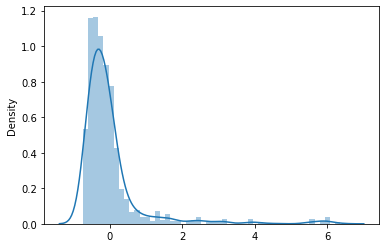

In [296]:
sns.distplot(random_pred)

In [297]:
pd.DataFrame({'Actual Price': y_test,'Predicted Price':random_pred})

,Actual Price,Predicted Price
0,-0.725004,-0.699580
1,-0.252988,-0.396546
2,-0.602083,-0.596655
3,-0.245613,-0.245613
4,-0.122692,-0.154015
...,...,...
1577,-0.368534,-0.342237
1578,-0.429994,-0.494856
1579,0.676294,0.933834
1580,-0.368534,-0.431131


Changing the threshold 

In [298]:
embed = SelectFromModel(model,threshold = 0.1, prefit=True)
print(embed.get_support())
X_new = embed.transform(X)

print('Before Embed', X.shape)
print('After Embed', X_new.shape)
print("The selected features are \n",X.columns[embed.get_support()]) 

[False False False  True False  True False False False False False False
 False False False False]
Before Embed (7906, 16)
After Embed (7906, 2)
The selected features are 
 Index(['max_power', 'Current_age'], dtype='object')


In [299]:
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 100, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 2)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)


{'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [300]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 110, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100]},
                   random_state=42, verbose=2)

In [301]:
rf_random.best_params_

{'n_estimators': 30,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None,
 'bootstrap': False}

In [302]:
rf_random.best_score_

0.960622379926793

In [303]:
random_forest = RandomForestRegressor(n_estimators= 40, min_samples_split= 2, min_samples_leaf= 1, bootstrap=False,max_features='sqrt')
random_forest.fit(X_train, y_train)
random_pred = random_forest.predict(X_test)

In [304]:
random_mean_absol_score = metrics.mean_absolute_error(y_test, random_pred)
random_mean_squared_error=metrics.mean_squared_error(y_test,random_pred)
random_rmse_error=np.sqrt(random_mean_squared_error)
acc_random = cross_val_score(random_forest, X_train, y_train, cv=5)

In [305]:
print("Average Mean Absolute Error is :", random_mean_absol_score)
print("Average Mean Squared Error is :", random_mean_squared_error)
print("Average RMSE is : ",random_rmse_error)

Average Mean Absolute Error is : 0.08273596891007161
Average Mean Squared Error is : 0.02455827604925345
Average RMSE is :  0.15671080386895297


<AxesSubplot:ylabel='Density'>

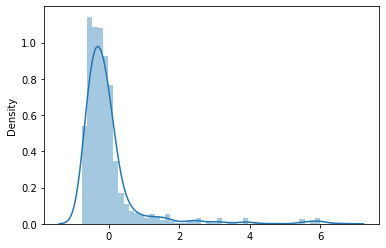

In [306]:
sns.distplot(random_pred)

In [307]:
pd.DataFrame({'Actual Price': y_test,'Predicted Price':random_pred})

,Actual Price,Predicted Price
0,-0.725004,-0.724697
1,-0.252988,-0.388416
2,-0.602083,-0.584414
3,-0.245613,-0.245613
4,-0.122692,-0.166790
...,...,...
1577,-0.368534,-0.313803
1578,-0.429994,-0.472924
1579,0.676294,0.876517
1580,-0.368534,-0.368534


In [308]:
rf_random.n_features_in_

6

In [309]:
from sklearn.metrics import r2_score
R2 = r2_score(y_test,random_pred)
R2

0.9728251289881474

In [310]:
X

,km_driven,mileage,engine,max_power,seats,Current_age,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,Manual,Individual,Trustmark Dealer,Diesel,LPG,Petrol
0,1.343777,23.40,-0.418188,-0.492024,-0.434128,-0.004158,0,0,0,0,1,1,0,1,0,0
1,0.894744,21.14,0.077980,0.333827,-0.434128,-0.004158,0,1,0,0,1,1,0,1,0,0
2,1.246926,17.70,0.075995,-0.380120,-0.434128,2.066530,0,0,0,1,1,1,0,0,0,1
3,1.018008,23.00,-0.124457,-0.044408,-0.434128,1.031186,0,0,0,0,1,1,0,1,0,0
4,0.894744,16.10,-0.318955,-0.094765,-0.434128,1.807694,0,0,0,0,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,0.718652,18.50,-0.519407,-0.244437,-0.434128,0.254678,0,0,0,0,1,1,0,0,0,1
8124,0.877135,16.80,0.068057,0.515111,-0.434128,1.807694,1,0,0,0,1,1,0,1,0,0
8125,0.894744,19.30,-0.418188,-0.494822,-0.434128,1.290022,0,0,0,0,1,1,0,1,0,0
8126,-0.778124,23.57,-0.124457,-0.603928,-0.434128,0.254678,0,0,0,0,1,1,0,1,0,0


In [311]:
y

array([-0.24561283, -0.34394955, -0.60454186, ..., -0.32919904,
       -0.44228627, -0.44228627])

In [312]:
model_= RandomForestRegressor()

In [313]:
random_forest_all_features = RandomizedSearchCV(estimator = model_, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1,scoring='neg_mean_squared_error')# Fit the random search model
random_forest_all_features.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 110, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [314]:
random_forest_all_features.best_params_

{'n_estimators': 20,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': None,
 'bootstrap': True}

In [315]:
predictions=random_forest_all_features.predict(X_test)

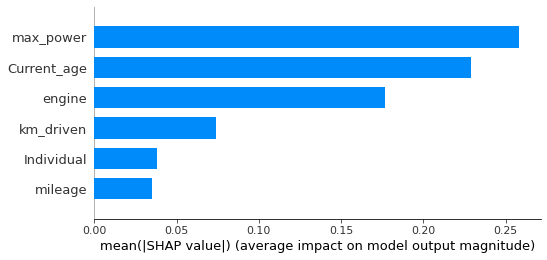

In [316]:
shap_values = shap.TreeExplainer(random_forest).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

<AxesSubplot:ylabel='Density'>

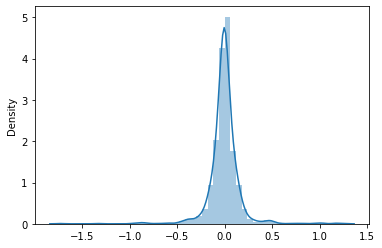

In [317]:
sns.distplot(y_test-predictions)

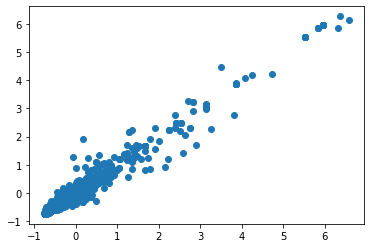

In [318]:
plt.scatter(y_test,predictions)

In [319]:
from sklearn.metrics import r2_score
R2 = r2_score(y_test,predictions)
R2

0.9695629159046968

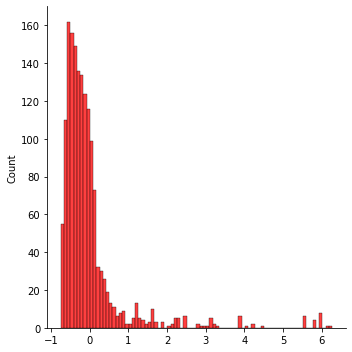

In [320]:
sns.displot(predictions,color='red')

In [321]:
df = pd.DataFrame({'Actual':y_test,"Predicted":predictions})
df.head()

,Actual,Predicted
0,-0.725004,-0.709393
1,-0.252988,-0.395128
2,-0.602083,-0.573758
3,-0.245613,-0.245613
4,-0.122692,-0.164742


In [322]:
from sklearn import metrics
MAE_= metrics.mean_absolute_error(y_test, predictions)
MSE_= metrics.mean_squared_error(y_test, predictions)
RMSE_= np.sqrt(MSE_Elastic)

In [323]:
pd.DataFrame([MAE_, MSE_, RMSE_], index=['MAE', 'MSE', 'RMSE'], columns=['Metrics'])

,Metrics
MAE,0.090337
MSE,0.027506
RMSE,195484.863407


In [324]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 0.09033686615213149
MSE: 0.027506379442271404
RMSE: 0.16585047314455093


In [325]:
import pickle

In [326]:
file=open('random_forest_all_features.pkl','wb')
pickle.dump(random_forest,file)